<a href="https://colab.research.google.com/github/rlskoeser/shxco-missingdata-specreading/blob/main/missing-data/Sco_prophet_missingdata_weekly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predict Weekly Missing Data from Shakespeare and Company Project 

## Setup Libraries and Load S&Co Data



In [ ]:
%%capture
try:
    import prophet
except ImportError:
    # If prophet is not installed, install it. We usually used Prophet in Google Colab.
    !pip install prophet

In [114]:
import pandas as pd
import requests
from datetime import timedelta, datetime, date
from datetimerange import DateTimeRange
import math
import warnings
warnings.filterwarnings('ignore')
import altair as alt
alt.data_transformers.disable_max_rows()

from prophet import Prophet

In [2]:
# use v1.2 datasets; load from our repo for convenience
csv_urls = {
    # official published versions 
    'members': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_members_v1.2_2022-01.csv',
    'books': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_books_v1.2_2022-01.csv',
    'events': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_events_v1.2_2022-01.csv',

    # project-specific data
    'partial_borrowers': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/partial_borrowers_collapsed.csv',
    'borrow_overrides': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/long_borrow_overrides.csv'
}

In [3]:
# load events
events_df = pd.read_csv(csv_urls['events'], low_memory=False)

## Prepare logbook event data

Logbooks are one of the primary sources of data for the S&Co Project, and detail the membership, renewal, and reimbursement activities. You can read more about them on the Project website [https://shakespeareandco.princeton.edu/sources/logbooks/](https://shakespeareandco.princeton.edu/sources/logbooks/).

In [4]:
# identify to logbook events

logbook_events_df = events_df[events_df.source_type.str.contains('Logbook')][[
   'event_type', 'start_date', 'end_date', 'subscription_purchase_date',
   'member_uris', 'member_names',
   'subscription_duration', 'subscription_duration_days',
   'subscription_volumes', 'subscription_category',
   'source_type'
]]

# May need to add format="mixed" depending on platform
logbook_events_df['start_date'] = pd.to_datetime(logbook_events_df['start_date'])
logbook_events_df['subscription_purchase_date'] = pd.to_datetime(logbook_events_df['subscription_purchase_date'])
logbook_events_df['logbook_date'] = logbook_events_df.apply(lambda row: row.subscription_purchase_date if pd.notna(row.subscription_purchase_date) else row.start_date, axis=1)


In [5]:
def earliest_date(row):
  # earliest date is the start date, subscription purchase date, or end date
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)

membership_events = events_df[events_df.event_type.isin(['Renewal', 'Subscription', 'Reimbursement' ,'Supplement', 'Separate Payment'])]
nonlogbook_membership_events = membership_events[~membership_events.source_type.str.contains('Logbook')]
membership_events['earliest_date'] = membership_events.apply(earliest_date, axis=1)
membership_events['date'] = pd.to_datetime(membership_events['earliest_date'], errors='coerce')

## Calculate logbook gaps

While much of the membership data is consistent, there are periods where there are gaps in the data, largely for archival reasons. We have calculated these gaps and now can explore their distribution.

In [6]:
response = requests.get('https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/logbook-dates.json')
logbook_dates = response.json()


In [7]:
# don't consider gaps shorter than 15 days
MIN_GAP_DAYS = 15

logbook_gaps = []
skipped_gaps = []

oneday = timedelta(days=1)


for i in range(len(logbook_dates) - 1):
  # gaps are between the logbook dates, so gap start is end of the first
  # and gap end is the start of the next

  # gap start and end dates are now included in the range instead of bounds outside the range
  gap_start = pd.to_datetime(logbook_dates[i]['endDate']) + oneday
  gap_end = pd.to_datetime(logbook_dates[i+1]['startDate']) - oneday
  interval = { 'start': gap_start, 'end': gap_end, 'days': (gap_end - gap_start).days }

  if interval['days'] > MIN_GAP_DAYS:
      logbook_gaps.append(interval) 
  elif interval['days'] > 0:  # ignore 0 and -1 duration "gaps"!
     skipped_gaps.append(interval)


print(f"The {len(logbook_gaps)} large gaps in the logbooks")
for interval in logbook_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} days)")

print(f"\nThe {len(skipped_gaps)} small gaps in the logbooks that will be skipped")
for interval in skipped_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} day{'s' if interval['days'] != 1 else ''})")

The 6 large gaps in the logbooks
	January 01 1928 to February 29 1928 (59 days)
	January 03 1930 to June 01 1930 (149 days)
	August 01 1930 to December 31 1930 (152 days)
	February 17 1931 to September 25 1932 (586 days)
	January 01 1937 to February 16 1938 (411 days)
	May 06 1938 to October 20 1938 (167 days)

The 5 small gaps in the logbooks that will be skipped
	October 30 1927 to November 01 1927 (2 days)
	February 07 1934 to February 08 1934 (1 day)
	January 01 1935 to January 11 1935 (10 days)
	December 29 1935 to January 01 1936 (3 days)
	August 29 1939 to September 12 1939 (14 days)


In [8]:
# get logbook event data *except* for during gaps
# — v1.2 dataset has 9 stray events in these gaps; 8 misattributed to logbook source, one documented in a later logbook

logbook_events_nogaps = logbook_events_df.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  logbook_events_nogaps = logbook_events_nogaps[~((logbook_events_nogaps.logbook_date >= gap_start) & (logbook_events_nogaps.logbook_date <= gap_end))]



# Missing membership events

## Logbook / membership events by week

In [16]:
logbooks_weekly_count = logbook_events_nogaps.groupby([pd.Grouper(key='logbook_date', freq='W')])['event_type'].count().reset_index()
logbooks_weekly_count.rename(columns={'event_type': 'total'}, inplace=True)

logbook_gaps_df = pd.DataFrame(logbook_gaps)
logbook_gaps_df['gap_label'] = logbook_gaps_df.apply(lambda row: '%s to %s (%d days)' % (row.start.date().isoformat(), row.end.date().isoformat(), row.days), axis=1)

# missing members

## member data setup

In [17]:
# split multiple members for shared accounts in events
events_df[
    ["first_member_uri", "second_member_uri"]
] = events_df.member_uris.str.split(";", expand=True)

# working with the first member for now...
# generate short ids equivalent to those in member and book dataframes
events_df["member_id"] = events_df.first_member_uri.apply(
    lambda x: x.split("/")[-2]
)
events_df["item_id"] = events_df.item_uri.apply(
    lambda x: x.split("/")[-2] if pd.notna(x) else None
)

In [18]:
# looking at all the data, what is the first event for each member?
member_dates = events_df.copy()

# make sure each event has an earliest known date
def earliest_date(row):
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)     

member_dates['earliest_date'] = member_dates.apply(earliest_date, axis=1)

In [19]:
# convert earliest date to datetime; convert partially known dates to -01-01  for now
member_dates['date'] = pd.to_datetime(member_dates['earliest_date'], errors='coerce')

In [20]:
# limit to the fields we want, drop unknown dates
members_added = member_dates[['event_type', 'member_id', 'date', 'source_type']].dropna(subset=['date'])

In [21]:
members_added = members_added[members_added['date'] < datetime(1942, 1, 1)]

In [22]:
# limit to member uri and date; then group by member and get the first date
members_grouped = members_added[["member_id", "date"]].groupby("member_id")
members_first_dates = members_grouped.first().reset_index()


In [23]:
newmember_yearly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_yearly_count.rename(columns={'member_id': 'total'}, inplace=True)

In [24]:
# group again but report on source and event type;
# customize sorting to order so subscriptions will show up first
from pandas.api.types import CategoricalDtype

# main order we care about is subscription first; other order matters less; reimbursement would be expected last
event_type = CategoricalDtype(categories=["Subscription", "Renewal", "Separate Payment", "Borrow", "Purchase", "Supplement", "Request", "Gift", "Crossed out", "Reimbursement"], ordered=True)
# copy member data frame, and convert event type to our new categorical type
member_events = members_added.copy()

member_events['event_type'] = member_events.event_type.astype(event_type)

# sort by date, then sort by event type so if there are any same-day events,
# subscription should always be first
member_events = member_events.sort_values(by=['date', 'event_type'])

members_first_events = member_events.groupby("member_id").first().reset_index()


### new members added, logbooks only

In [25]:
# get first events for each member from logbooks only

# go back to member events, limit to logbook events, then group and get first event
logbook_first_events = member_events[member_events.source_type.str.contains('Logbook')].groupby("member_id").first().reset_index()


In [26]:
# get new member yearly count for logbook-sourced events only 
logbook_newmembers_by_year = logbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
logbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)


### aggregate by month instead of year

confusing because totals and graphs in the dataset essay are monthly, it looks wrong

In [27]:
# get new member monthly count for logbook-sourced events only 
logbook_newmembers_by_month = logbook_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
logbook_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)

In [28]:
newmember_monthly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
newmember_monthly_count.rename(columns={'member_id': 'total'}, inplace=True)

### members only documented in address books

In [29]:
# what about members we _only_ know about from the address books?

# any member with at least one event in the logbooks
logbook_members = member_events[member_events.source_type.str.contains('Logbook')].member_id.unique()
# any member with at least one event on a card
lending_card_members = member_events[member_events.source_type.str.contains('Lending Library Card')].member_id.unique()
# any member with at least one event from an address book
addressbook_members = member_events[member_events.source_type.str.contains('Address Book')].member_id.unique()

# get a list of address-book-only members 
address_book_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(lending_card_members)



In [30]:
# get date added for address-only members

addressbook_first_events = member_events[member_events.member_id.isin(address_book_only_members)].groupby("member_id").first().reset_index()


In [31]:
# get new member yearly count for addressbook-only members events only 
addressbook_newmembers_by_year = addressbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
addressbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)

### members only documented on lending cards

In [32]:
# do we have any lending-card only members?

# get a list of address-book-only members 
lending_card_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(addressbook_members)


In [33]:
# card-only member first events
cardonly_first_events = member_events[member_events.member_id.isin(lending_card_only_members)].groupby("member_id").first().reset_index()


In [34]:
# get new member yearly count for lending card-only members
cardonly_newmembers_by_year = cardonly_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
cardonly_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)


### other members

In [35]:
# get all other members so we can generate stacked area chart properly

other_members = set(member_events.member_id.unique()) - set(lending_card_only_members) - set(address_book_only_members)
 

In [36]:
# other member first events
other_member_first_events = member_events[member_events.member_id.isin(other_members)].groupby("member_id").first().reset_index()


In [37]:
# new member yearly count 
other_newmembers_by_year = other_member_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
other_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)


In [38]:
# plot all three sets of new members together

# combine into a single df for plotting with altair

def combine_newmember_counts():
  # new_member_counts = newmember_yearly_count.copy()
  # new_member_counts['series'] = 'all events'

  # FIXME: this is not plotting the same thing as the others!
  # logbook_newmembers = logbook_newmembers_by_year.copy()
  # logbook_newmembers['series'] = 'logbook events only'

  other_newmembers = other_newmembers_by_year.copy()
  other_newmembers['series'] = 'all other members'

  addressbook_newmembers = addressbook_newmembers_by_year.copy()
  addressbook_newmembers['series'] = 'addressbook-only members'
  
  card_newmembers = cardonly_newmembers_by_year.copy()
  card_newmembers['series'] = 'card-only members'
  
  # combined_new_member_counts_df = pd.concat([new_member_counts, logbook_newmembers, addressbook_newmembers])
  combined_new_member_counts_df = pd.concat([other_newmembers, addressbook_newmembers, card_newmembers])

  return combined_new_member_counts_df

combine_newmember_counts_df = combine_newmember_counts()



# # clear from any previous run
# plt.clf()
# # setup shared axis
# fig, ax = plt.subplots(figsize=(20, 5))

# sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
# sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')
# sns.lineplot(data=addressbook_newmembers_by_year, x='date', y='total', label='new members (addressbook-only members)')

# for i, gap in enumerate(logbook_gaps): 
#   gap_start = pd.to_datetime(gap['start'])
#   gap_end = pd.to_datetime(gap['end'])
#   ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

### aggregate new members from source by month

In [39]:
# get new member monthly count for addressbook-only members events only 
addressbook_newmembers_by_month = addressbook_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
addressbook_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)


In [41]:
# get new member monthly count for lending card-only members
cardonly_newmembers_by_month = cardonly_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
cardonly_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)


In [42]:
# new member monthly count 
other_newmembers_by_month = other_member_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
other_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)


In [43]:
# combine into a single df for plotting with altair

def combine_newmember_monthly_counts():
  # new_member_counts = newmember_yearly_count.copy()
  # new_member_counts['series'] = 'all events'

  # FIXME: this is not plotting the same thing as the others!
  # logbook_newmembers = logbook_newmembers_by_year.copy()
  # logbook_newmembers['series'] = 'logbook events only'

  other_newmembers = other_newmembers_by_month.copy()
  other_newmembers['series'] = 'all other members'

  addressbook_newmembers = addressbook_newmembers_by_month.copy()
  addressbook_newmembers['series'] = 'addressbook-only members'
  
  card_newmembers = cardonly_newmembers_by_month.copy()
  card_newmembers['series'] = 'card-only members'
  
  # combined_new_member_counts_df = pd.concat([new_member_counts, logbook_newmembers, addressbook_newmembers])
  combined_new_member_counts_df = pd.concat([other_newmembers, addressbook_newmembers, card_newmembers])

  return combined_new_member_counts_df

combine_newmember_monthly_counts_df = combine_newmember_monthly_counts()



## new members by first subscription

In [44]:
# to model properly, we only expect membership to start with a subscription
# include renewals, since sometimes they were written down for each other

# go back to member events, limit to logbooks AND by event type, then group and get first event for each member
subscription_first_events = member_events[member_events.source_type.str.contains('Logbook') & member_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_id").first().reset_index()

In [45]:
# exclude from gaps, just in case

subscription_first_events_nogaps = subscription_first_events.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  subscription_first_events_nogaps = subscription_first_events_nogaps[~((subscription_first_events_nogaps.date >= gap_start) & (subscription_first_events_nogaps.date <= gap_end))]



In [173]:
# get new member yearly count based only on subscriptions
# newmember_subscriptions_by_year = subscription_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()

newmember_subscriptions_by_year = subscription_first_events_nogaps.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_subscriptions_by_year.rename(columns={'member_id': 'total'}, inplace=True)


In [174]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_subscriptions_by_week = subscription_first_events_nogaps.groupby([pd.Grouper(key='date', freq='W')])['member_id'].count().reset_index()
newmember_subscriptions_by_week.rename(columns={'member_id': 'total'}, inplace=True)

### use prophet to forecast missing subscriptions

In [194]:
def prepare_data_for_prophet(weekly_subscriptions, gap_start_date, post1932_date):
    # Filter data based on gap start date and post1932 condition
    data_before_gap = weekly_subscriptions[weekly_subscriptions.date < gap_start_date]
    if gap_start_date.year >= 1936:
        data_before_gap = data_before_gap[data_before_gap.date >= post1932_date]
    # Rename columns for Prophet
    return data_before_gap.rename(columns={'date': 'ds', 'total': 'y'})

def forecast_gap_with_prophet(data_before_gap, gap_duration, one_week_duration, use_weekly_growth_cap=False, growth_cap=None):
    # Initialize Prophet and fit data
    if use_weekly_growth_cap:
        prophet_model = Prophet(growth='logistic', weekly_seasonality=True)
        data_before_gap['floor'] = 0
        data_before_gap['cap'] = growth_cap
    else:
        prophet_model = Prophet()
    prophet_model.fit(data_before_gap)
    
    # Calculate forecast period in weeks and add extra buffer
    forecast_duration = math.ceil(gap_duration['days'] / 7) + 7
    future_subscriptions = prophet_model.make_future_dataframe(periods=forecast_duration, freq='W')
    
    # Perform forecasting
    if use_weekly_growth_cap:
        future_subscriptions['floor'] = 0
        future_subscriptions['cap'] = growth_cap
    forecasted_subscriptions = prophet_model.predict(future_subscriptions)
    
    # Filter forecast for the gap duration with an additional one-week buffer
    forecast_near_gap = forecasted_subscriptions[(forecasted_subscriptions.ds > (gap_duration['start'] - one_week_duration)) & (forecasted_subscriptions.ds < (gap_duration['end'] + one_week_duration))]
    return forecasted_subscriptions

def forecast_missing_subscriptions(weekly_subscriptions, logbook_gaps, post1932_date, train_all_data=False, return_prophet_model=False, use_weekly_growth_cap=False, use_total_growth_cap=False):
    one_week_duration = timedelta(days=7)
    
    growth_cap = weekly_subscriptions.total.max() if use_weekly_growth_cap else None
    if train_all_data:
        prophet_model = Prophet(weekly_seasonality=True, growth='logistic') if use_total_growth_cap else Prophet(weekly_seasonality=True)
        if use_total_growth_cap:
            weekly_subscriptions['floor'] = 0
            weekly_subscriptions['cap'] = growth_cap
        prophet_model.fit(weekly_subscriptions.rename(columns={'date': 'ds', 'total': 'y'}))
    
    all_forecasts = []

    for gap in logbook_gaps:
        gap_start_date = gap['start']

        data_before_gap = prepare_data_for_prophet(weekly_subscriptions, gap_start_date, post1932_date)
        forecasted_subscriptions = forecast_gap_with_prophet(data_before_gap, gap, one_week_duration, use_weekly_growth_cap, growth_cap)
        
        # Optional: Display or process forecast_near_gap as needed
        # display(forecast_near_gap.head())

        if train_all_data:
            if use_total_growth_cap:
                forecasted_subscriptions['floor'] = 0
                forecasted_subscriptions['cap'] = growth_cap

            reforecasted_subscriptions = prophet_model.predict(forecasted_subscriptions)
            all_forecasts.append(reforecasted_subscriptions)
        else:
            all_forecasts.append(forecasted_subscriptions)

    # Combine all forecasts into a single DataFrame
    if return_prophet_model:
        return prophet_model, pd.concat(all_forecasts)
    else:
        return pd.concat(all_forecasts)

post1932_date = pd.to_datetime(date(1932, 9, 27))
# Assuming `weekly_subscriptions` and `logbook_gaps` are defined elsewhere
forecasted_subscriptions = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date)

15:51:34 - cmdstanpy - INFO - Chain [1] start processing


15:51:34 - cmdstanpy - INFO - Chain [1] done processing
15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing
15:51:34 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing
15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:35 - cmdstanpy - INFO - Chain [1] done processing


In [195]:
def plot_gap_areas(logbook_gaps, chart_height, include_line=False):
    if include_line:
        base = alt.Chart(newmember_subscriptions_by_week).encode(
            alt.X('date:T', axis=alt.Axis(title='Duration of the Lending Library'))
        ).properties(
            width=1200,
            height=chart_height
        )


        line = base.mark_line(stroke='#5276A7').encode(
            alt.Y('total',
                axis=alt.Axis(title='Total', titleColor='#5276A7'))
        )

    gap_areas = None
    for gap in logbook_gaps:

        rect_df = pd.DataFrame({
            'x1': [pd.to_datetime(gap['start'])],
            'x2': [pd.to_datetime(gap['end'])],
        })
        area = alt.Chart(rect_df).mark_rect(opacity=0.3, color='gray').encode(
            x='x1', x2='x2',
            y=alt.value(0), y2=alt.value(chart_height)
        )

        if gap_areas is None:
            gap_areas = area 
        else:
            gap_areas += area
    return line + gap_areas if include_line else gap_areas

def plot_newsubs_weekly_forecast(forecast_df, gap_areas, logbook_gaps, chart_height, post1932, show_model=False, separate_model_decades=False, newmember_subscriptions_by_week=newmember_subscriptions_by_week ):
    forecast_uniq = forecast_df.drop_duplicates(keep='first').reset_index(drop=True)
    known_df = newmember_subscriptions_by_week.copy()

    # Set base chart properties
    base = alt.Chart().encode(
        alt.X('date:T', axis=alt.Axis(title='Date'))
    ).properties(
        width=1200,
        height=chart_height  # Assuming `chart_height` is intended to be 600, adjust as needed
    )
    
    line_width = 1

    # label as documented information
    known_df['label'] = "Documented"
    label_colors = {"Documented": "#5276A7", "Forecast model - 1920s": "red", "Forecast model - 1930s": "purple", "Forecast": "orange", "Forecast model": "red"}

    if not show_model:
        keys_to_remove = ["Forecast model", "Forecast model - 1920s", "Forecast model - 1930s"]
    elif separate_model_decades:
        keys_to_remove = ["Forecast model"]
    else:
        keys_to_remove = ["Forecast model - 1920s", "Forecast model - 1930s"]

    for key in keys_to_remove:
        label_colors.pop(key, None)

    newmember_line = base.mark_line(strokeWidth=line_width).encode(
        alt.Y('total', axis=alt.Axis(title='total')),
        color=alt.Color('label:N', legend=alt.Legend(title=""), scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values()))),
    ).properties(data=known_df)

    graph = newmember_line

    max_y = known_df.total.max()
    y_scale = alt.Scale(domain=(0, max_y + 5), clamp=True)

    if show_model:
        forecast_uniq['ds'] = pd.to_datetime(forecast_uniq['ds'])  # Ensure ds is datetime for comparison

        if separate_model_decades:
            forecast_uniq['label'] = forecast_uniq.apply(
                lambda x: "Forecast model - 1920s" if x.ds < post1932 else "Forecast model - 1930s", axis=1
            )

            forecast_line = base.mark_line(opacity=0.5, strokeWidth=line_width).encode(
                alt.X('ds:T'),
                alt.Y('yhat', scale=y_scale),
                color=alt.Color('label', scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
            ).properties(data=forecast_uniq)

            graph += forecast_line
        else:
            forecast_uniq['label'] = 'Forecast model'
            forecast_line = base.mark_line(opacity=0.5, strokeWidth=line_width).encode(
                alt.X('ds:T'), alt.Y('yhat', scale=y_scale),
                color=alt.Color("label", scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
            ).properties(data=forecast_uniq)

            graph += forecast_line    

    # Handle gaps
    onemonth = timedelta(days=30)

    for i, gap in enumerate(logbook_gaps):
        gap_start, gap_end = pd.to_datetime(gap['start']), pd.to_datetime(gap['end'])
        gap_forecast = forecast_uniq[(forecast_uniq.ds >= gap_start - onemonth) & (forecast_uniq.ds <= gap_end + onemonth)]


        gap_forecast['label'] = 'Forecast'
        line = base.mark_line(strokeWidth=line_width).encode(
            alt.X('ds:T'), alt.Y('yhat', scale=y_scale),
            color=alt.Color("label", scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
        ).properties(data=gap_forecast)

        graph += line

        # Create and combine areas for gaps
        area = base.mark_area(opacity=0.3).encode(
            alt.Y('yhat_lower', scale=y_scale),
            alt.Y2('yhat_upper'),
            alt.X('ds:T'),
            alt.Color("label", scale=alt.Scale(domain=list(label_colors.keys()), range=list(label_colors.values())))
        ).properties(data=gap_forecast)
        gap_areas += area

    return (graph + gap_areas).configure(font="Noto Serif")



#### plot the forecasts

In [196]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=False, separate_model_decades=False)

alt.LayerChart(...)

In [197]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

In [198]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(forecasted_subscriptions, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=True)

alt.LayerChart(...)

### what if we fit prophet on all weeks?

In [199]:
prophet_model, all_newsub_weekly_forecasts_dfs = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=True, return_prophet_model=True)

15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing


15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing
15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing
15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing
15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing


In [200]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(all_newsub_weekly_forecasts_dfs, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

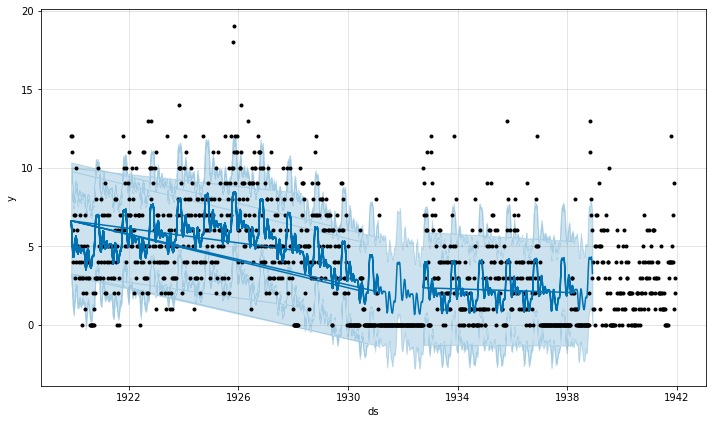

In [201]:
fig1 = prophet_model.plot(all_newsub_weekly_forecasts_dfs)

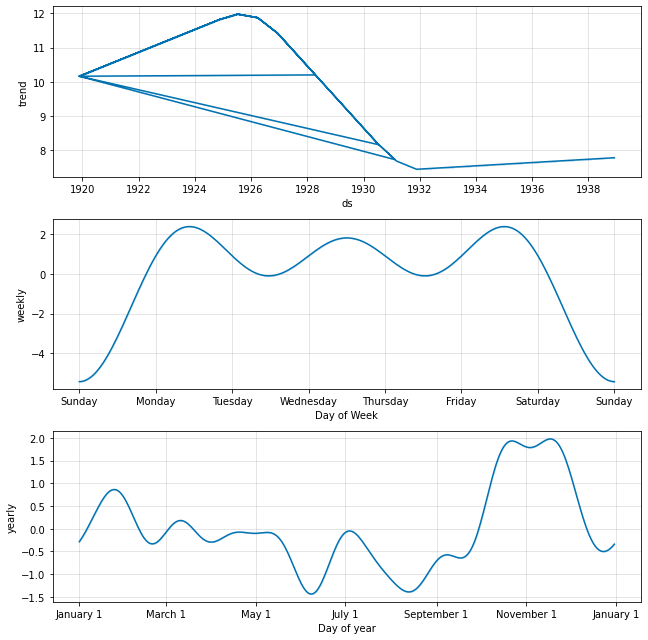

In [202]:
fig2 = prophet_model.plot_components(all_newsub_weekly_forecasts_dfs)

In [203]:
newsubs_base = alt.Chart(newmember_subscriptions_by_week).encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_line = newsubs_base.mark_line().encode(
    alt.Y('total',
          axis=alt.Axis(title='new subscriptions per week'))
)

# draw rectangles to highlight logbook gaps
logbook_gaps_span = alt.Chart(logbook_gaps_df).encode(
     alt.X('start')
).properties(
    width=1200,
    height=275
).mark_rect(
    opacity=0.2, color="gray"
).encode(
    x='start',
    x2='end',
    y=alt.value(0),  # 0 pixels from bottom
    y2=alt.value(275)  # 300 pixels from top
)

newsubs_forecast_base = alt.Chart(forecasted_subscriptions).encode(
    alt.X('ds:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_forecast_line = newsubs_forecast_base.mark_line(color="orange").encode(
    alt.Y('yhat',
          axis=alt.Axis(title='new subscriptions per week'), scale=alt.Scale(domain=[0, 20])),
)
# .transform_filter(
    # alt.FieldLTPredicate(field='ds', lt=date(1919, 1,1))
# )

newsubs_area = newsubs_forecast_base.mark_area(opacity=0.3, color='orange').encode(
    alt.Y('yhat_upper',
          axis=alt.Axis(title=None), scale=alt.Scale(domain=[0, 20])),
    alt.Y2('yhat_lower')
)

# add newsubs last so it will be layered on top
newsubs_line + logbook_gaps_span + newsubs_area + newsubs_forecast_line

alt.LayerChart(...)

### forecast again, with growth and cap

the default forecast behavior is following a downward trend in the existing data leading into our later gaps, but based on the data afterwards that doesn't look right. 




In [204]:
# when is the largest week? 
growth_cap = newmember_subscriptions_by_week.total.max()
newmember_subscriptions_by_week[newmember_subscriptions_by_week.total == growth_cap]

,date,total
311,1925-11-08,19


In [205]:
newsub_weekly_growth_forecasts = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=False, return_prophet_model=False, use_weekly_growth_cap=True)

15:51:52 - cmdstanpy - INFO - Chain [1] start processing


15:51:52 - cmdstanpy - INFO - Chain [1] done processing
15:51:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:52 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:53 - cmdstanpy - INFO - Chain [1] start processing
15:51:53 - cmdstanpy - INFO - Chain [1] done processing
15:51:54 - cmdstanpy - INFO - Chain [1] start processing
15:51:54 - cmdstanpy - INFO - Chain [1] done processing


In [206]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=False, separate_model_decades=False)

alt.LayerChart(...)

In [207]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

### fit on all weeks, logistic growth

In [208]:
lognewsub_weeks_fcst = forecast_missing_subscriptions(newmember_subscriptions_by_week, logbook_gaps, post1932_date, train_all_data=True, return_prophet_model=False, use_weekly_growth_cap=True, use_total_growth_cap=True)

15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing
15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing
15:52:03 - cmdstanpy - INFO - Chain [1] start processing
15:52:03 - cmdstanpy - INFO - Chain [1] done processing
15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing
15:52:04 - cmdstanpy - INFO - Chain [1] start processing
15:52:04 - cmdstanpy - INFO - Chain [1] done processing
15:52:05 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing
15:52:05 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing


In [209]:
chart_height = 275
gap_areas = plot_gap_areas(logbook_gaps, chart_height, include_line=False)
plot_newsubs_weekly_forecast(lognewsub_weeks_fcst, gap_areas, logbook_gaps, chart_height, post1932_date, show_model=True, separate_model_decades=False)

alt.LayerChart(...)

### aggregate forecast values

In [211]:



onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)
oneweek = timedelta(days=7)

# newsub_member_total = len(subscription_first_events.member_id.unique())
# member_total = len(events_df.member_id.unique())

# allow overrides for aggregrating uniq name estimates
def aggregrate_missing_newsub_estimates(forecast_df, newmember_subscriptions_by_week=newmember_subscriptions_by_week, newsub_member_total=None, member_total=None):

  newsub_weekly_missing = 0
  newsub_weekly_missing_upper = 0
  newsub_weekly_missing_lower = 0

  if newsub_member_total is None:
    newsub_member_total = len(subscription_first_events.member_id.unique())
  if member_total is None:
    member_total = len(events_df.member_id.unique())


  newsub_weekly_estimates = []

  for i, gap in enumerate(logbook_gaps): 
    gap_start = gap['start']
    gap_end = gap['end']
    # print(gap_start, gap_end)
    # print('gap range ')
    gap_range = DateTimeRange(gap_start, gap_end)
    # print(gap_range)

    # get documented counts for this time period
    gap_counts = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date >= gap_start) & (newmember_subscriptions_by_week.date <= gap_end + oneweek)]
    # now get the forecast for the same weeks
    
    # weekly_forecast = newsub_weekly_forecasts_df[(newsub_weekly_forecasts_df.ds >= gap_start) & (newsub_weekly_forecasts_df.ds <= gap_end + oneweek)]

    weekly_forecast = forecast_df[(forecast_df.ds >= gap_start) & (forecast_df.ds <= gap_end + oneweek)]
    # print(weekly_forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())

    for week in gap_counts.itertuples():
      week_start = week.date 

      # do logbook weeks and forecast weeks match?
      # missing estimate is the forecast value minus any actual recorded count for this day
      documented_week = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date == week.date]  #.iloc[0]
      # seems possible there's no documented week
      if documented_week.shape[0]:
        documented_week = documented_week.iloc[0]
      else: 
        documented_week = None

      # check if the padding put us past the end of the current gap
      if week_start > gap_end:
        continue

      # get the end of the same month (first of the next month minus one day)
      week_end = week_start + oneweek
      # how many days from this month overlap with our gap?
      gap_intersection = gap_range.intersection(DateTimeRange(week_start, week_end))
      overlap_days = gap_intersection.timedelta.days
      if overlap_days != 7:
        print('gap overlap for %s is %d days' % (week_end, overlap_days))
      # what is our threshold for using the forecast value instead of recorded? 
      # let's try 3 days
      if overlap_days > 3:
        week_total = 0
        if not documented_week.empty:
          week_total = week.total

        # get the forecast value for this week
        week_forecast = weekly_forecast[(weekly_forecast.ds >= week_start) & (weekly_forecast.ds <= week_end)].iloc[0]
        # missing estimate is the forecast value minus any actual recorded count for this month
        newsub_weekly_missing += max(0, (max(0, week_forecast.yhat) - week_total))
        newsub_weekly_missing_upper += (week_forecast.yhat_upper - week_total)
        # cap lower estimate at zero
        newsub_weekly_missing_lower += max(0, (max(0, week_forecast.yhat_lower) - week_total))

        # aggregate forecast values so we can output as csv for reference
        newsub_weekly_estimates.append({
            'date': week.date,
            'documented_total': week_total,
            'gap_days': overlap_days,
            'forecast': week_forecast.yhat,
            'forecast_upper': week_forecast.yhat_upper,
            'forecast_lower': week_forecast.yhat_lower,
            'forecast_range': week_forecast.yhat_upper - week_forecast.yhat_lower,
        })

        newsub_estimates_df = pd.DataFrame(newsub_weekly_estimates)
        newsub_estimates_df.to_csv('newsub_weekly_forecast.csv', index=False)

  print('''\n\nmissing estimates:
    %s
    upper: %s
    lower: %s''' % (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower))
  
  estimated_total = newsub_member_total + newsub_weekly_missing
  estimated_total_upper = newsub_member_total + newsub_weekly_missing_upper
  estimated_total_lower = newsub_member_total + newsub_weekly_missing_lower

  est_percent = (member_total / estimated_total ) * 100
  est_percent_upper = (member_total / estimated_total_upper ) * 100
  est_percent_lower = (member_total / estimated_total_lower ) * 100

  # summarize the result
  print('''
  total unique members: %d
  total members from first subscriptions: %d
  estimated missing subscriptions: %.2f (upper %.2f, lower %.2f)
  estimated total subscriptions from logbooks: %.2f (upper %.2f, lower %.2f)
  total missing: %d (upper %d, lower %d)
  estimated percent: %.2f (upper %.2f, lower %.2f)
  ''' % (member_total, newsub_member_total, 
         # estimated missing
          newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower,
         # estimated total
          estimated_total, estimated_total_upper, estimated_total_lower, 
         # total missing
          max(0, estimated_total - member_total),
            estimated_total_upper - member_total,
          max(0, estimated_total_lower - member_total),
          est_percent, est_percent_upper, est_percent_lower
          ))
  
  # return (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower)
  
# newsub_missing, newsub_missing_upper, newsub_missing_lower = aggregrate_missing_newsub_estimates()

### summarize

In [212]:
# initial forecast, calculated the same way as membership activity
aggregrate_missing_newsub_estimates(forecasted_subscriptions)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    457.87281808915867
    upper: 1130.362623095424
    lower: 93.82087128834623

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 457.87 (upper 1130.36, lower 93.82)
  estimated total subscriptions from logbooks: 4777.87 (upper 5450.36, lower 4413.82)
  total missing: 0 (upper 311, lower 0)
  estimated percent: 107.56 (upper 94.29, lower 116.43)
  


In [213]:
# second forecast, fitting prophet on all data 
# - this result seems better than the first linear model
aggregrate_missing_newsub_estimates(all_newsub_weekly_forecasts_dfs)


gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    494.31937615945714
    upper: 1219.2196013719995
    lower: 30.45513153889603

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 494.32 (upper 1219.22, lower 30.46)
  estimated total subscriptions from logbooks: 4814.32 (upper 5539.22, lower 4350.46)
  total missing: 0 (upper 400, lower 0)
  estimated percent: 106.74 (upper 92.77, lower 118.13)
  


In [214]:
# third forecast, with logistic growth and cap
aggregrate_missing_newsub_estimates(newsub_weekly_growth_forecasts)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    711.7022603722537
    upper: 1458.3130200660064
    lower: 150.42069710119958

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 711.70 (upper 1458.31, lower 150.42)
  estimated total subscriptions from logbooks: 5031.70 (upper 5778.31, lower 4470.42)
  total missing: 0 (upper 639, lower 0)
  estimated percent: 102.13 (upper 88.94, lower 114.96)
  
